In [1]:
%load_ext autoreload
%autoreload 2

# Always run

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import composite
%matplotlib inline
from numpy import trapz
import copy
import glob as glob
from numpy import trapz
from astropy.time import Time
from scipy import interpolate
c = 299792 #speed of light in km/s

In [3]:
def gsmooth(x_array, y_array, var_y, vexp = .001, nsig = 5.0):
    #returns smoothed flux array
    # if no variance array create a constant one
    if len(var_y) == 0:
        var_y = np.zeros(len(y_array))
        
    for i in range(len(var_y)):
        if var_y[i] == 0:
            var_y[i] = 1E-20
            # var_y[i] = 1E-31
    
    # Output y-array
    new_y = np.zeros(len(x_array), float)
    
    # Loop over y-array elements
    for i in range(len(x_array)):
        
        # Construct a Gaussian of sigma = vexp*x_array[i]
        gaussian = np.zeros(len(x_array), float)
        sigma = vexp*x_array[i]
        
        # Restrict range to +/- nsig sigma
        sigrange = np.nonzero(abs(x_array-x_array[i]) <= nsig*sigma)
        gaussian[sigrange] = (1/(sigma*np.sqrt(2*np.pi)))*np.exp(-0.5*((x_array[sigrange]-x_array[i])/sigma)**2)
        
        # Multiply Gaussian by 1 / variance
        W_lambda = gaussian / var_y
        
        # Perform a weighted sum to give smoothed y value at x_array[i]
        W0 = np.sum(W_lambda)
        W1 = np.sum(W_lambda*y_array)
        new_y[i] = W1/W0

    # Return smoothed y-array
    return new_y

In [4]:
def autosmooth(x_array, y_array, var_y):
    new_y_init = gsmooth(x_array, y_array, var_y, .001)
    SNR = np.mean(new_y_init / var_y)
    
    if SNR < 5:
        vexp_auto = .0045#.0025 #temp value, need to fine tune using SNR in excel spreadsheet
    elif 5 <= SNR < 20:
        vexp_auto = .004#.002
    elif 20 <= SNR < 40:
        vexp_auto = .003#.0015
    elif 40 <= SNR < 60:
        vexp_auto = .002#.001
    elif 60 <= SNR < 100:
        vexp_auto = .0015#.00075
    else:
        vexp_auto = .001#.0005
    
    new_y = gsmooth(x_array, y_array, var_y, vexp_auto)
    return new_y

In [5]:
def autovexp(x_array, y_array, var_y):
    new_y_init = gsmooth(x_array, y_array, var_y, .001)
    SNR = np.mean(new_y_init / var_y)
        
    if SNR < 5:
        vexp_auto = .0045#.0025 #temp value, need to fine tune using SNR in excel spreadsheet
    elif 5 <= SNR < 20:
        vexp_auto = .004#.002
    elif 20 <= SNR < 40:
        vexp_auto = .003#.0015
    elif 40 <= SNR < 60:
        vexp_auto = .002#.001
    elif 60 <= SNR < 100:
        vexp_auto = .0015#.00075
    else:
        vexp_auto = .001#.0005
            
    return vexp_auto

In [6]:
sn_query = "SELECT * from Supernovae inner join Photometry ON Supernovae.SN = Photometry.SN where phase >= -5 and phase <= 5"

In [7]:
SN_Array = composite.grab(sn_query, multi_epoch = False, make_corr = True, selection = "max_coverage")

ERROR:  sn2006oa-20061122-not.dat None
ERROR:  sn2007jg-20070918-not.dat None
ERROR:  sn1992a-19920116.220-iue.flm None
172 questionable files currently ignored
Generate variance failed for:  [u'sn2004dt-20040820-hst.flm', u'sn2004dt-20040823-hst.flm', u'sn2004ef-20040914-hst.flm', u'sn2004ef-20040918-hst.flm', u'sn2005cf-20050611-hst.flm', u'sn2005cf-20050614-hst.flm', u'sn2005m-20050131-hst.flm']
(65, 'questionable spectra removed', 978, 'spectra left')
(22, 'Peculiar Ias removed', 956, 'spectra left')
745 spectra with host corrections
172 questionable files currently ignored
198 valid SNe found
Arrays cleaned


In [8]:
print(SN_Array)

[<composite.supernova object at 0x000000000B6927F0>, <composite.supernova object at 0x000000000B692A58>, <composite.supernova object at 0x000000000B692748>, <composite.supernova object at 0x000000000B692A20>, <composite.supernova object at 0x000000000B692B38>, <composite.supernova object at 0x000000000B692898>, <composite.supernova object at 0x000000000B692860>, <composite.supernova object at 0x000000000B692A90>, <composite.supernova object at 0x000000000B692908>, <composite.supernova object at 0x000000000B692CF8>, <composite.supernova object at 0x000000000B692B70>, <composite.supernova object at 0x000000000B692DA0>, <composite.supernova object at 0x000000000B692D68>, <composite.supernova object at 0x000000000B692E10>, <composite.supernova object at 0x000000000B692D30>, <composite.supernova object at 0x000000000B692F28>, <composite.supernova object at 0x000000000B6B5160>, <composite.supernova object at 0x000000000B6B5240>, <composite.supernova object at 0x000000000B6B5278>, <composite.

In [9]:
SN_attributes = dir(SN_Array[0])
print(SN_attributes)

['B_minus_V', 'Bmag_salt', 'Bmag_salt2', 'Ebv_host', 'GasRich', 'SNR', '__class__', '__delattr__', '__dict__', '__doc__', '__format__', '__getattribute__', '__hash__', '__init__', '__module__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'av_25', 'av_mlcs17', 'av_mlcs31', 'bias_lc', 'c_lc', 'c_salt', 'c_salt2', 'carbon', 'cov_mb_c_lc', 'cov_mb_s_lc', 'cov_s_c_lc', 'csp_light_curves', 'czCMB_host', 'czLG_host', 'cz_host', 'dec', 'delta_mlcs17', 'delta_mlcs31', 'dm15', 'dm15_array', 'dm15_from_fits', 'dm15_source', 'e_Bmag_salt', 'e_Bmag_salt2', 'e_av_mlcs17', 'e_av_mlcs31', 'e_c_lc', 'e_c_salt', 'e_c_salt2', 'e_delta_mlcs17', 'e_delta_mlcs31', 'e_dm15', 'e_logMst_lc', 'e_mb_lc', 'e_mu_mlcs17', 'e_mu_mlcs31', 'e_mu_salt', 'e_mu_salt2', 'e_s_salt', 'e_tmax_lc', 'e_v', 'e_x1_lc', 'e_x1_salt2', 'e_zCMB_mlcs17', 'e_zCMB_mlcs31', 'e_zCMB_salt', 'e_zCMB_salt2', 'filename', 'filt_host', 'flux', 'glat_host', 'gl

In [10]:
for i, sn in enumerate(SN_Array):
    print(i, sn.name, sn.filename, sn.phase, sn.source)

(0, u'1994d', u'sn1994d-19940317.flm', -4.118524077449018, u'bsnip')
(1, u'1994s', u'sn1994s-19940616-uoi.flm', 0.9988405962732136, u'bsnip')
(2, u'1995d', u'sn1995d-19950224-uohp.flm', 3.670915125858948, u'bsnip')
(3, u'1995e', u'sn1995e-19950224-uoi2.flm', -2.176803499498083, u'bsnip')
(4, u'1997br', u'sn1997br-19970416-uoi.flm', -4.418660365560601, u'bsnip')
(5, u'1997y', u'sn1997y-19970209-uohp.flm', 2.7720191442561264, u'bsnip')
(6, u'1998dk', u'sn1998dk-19980831-ui.flm', -0.7283716550889345, u'bsnip')
(7, u'1998dm', u'sn1998dm-19980831-ui-corrected.flm', -4.865205879574189, u'bsnip')
(8, u'1998dx', u'sn1998dx-19980921-ui.flm', 4.71152240889689, u'bsnip')
(9, u'1998es', u'sn1998es-19981125-ui-corrected.flm', 0.4967508339381827, u'bsnip')
(10, u'1999aa', u'sn1999aa-19990223-ui.flm', 0.4603511483683075, u'bsnip')
(11, u'1999ac', u'sn1999ac-19990312-ui-corrected.flm', -0.3853392768725628, u'bsnip')
(12, u'1999cp', u'sn1999cp-19990709-ui-corrected.flm', 4.856956056582031, u'bsnip')
(1

# Measurement Code

In [11]:
def find_min_wave(wavelength, flux, w1 = 5900, w2 = 6500):#, error = False, n = 1000):
    wave_domain = np.where((wavelength > w1) & (wavelength < w2))
    #print wavelength
    flux_range = []
    for position in wave_domain[0]:
        #print position
        fluxelem = flux[position]
        flux_range.append(fluxelem)
    
    #print flux_range
    elem_flux = np.amin(flux_range)
    min_index = np.where((flux == elem_flux))
    min_wave = wavelength[min_index][0]
    
    return min_wave

In [12]:
def find_max_wave(wavelength, flux, w1 = 5900, w2 = 6500):#, error = False, n = 1000):
    wave_domain = np.where((wavelength > w1) & (wavelength < w2))
    #print wavelength
    flux_range = []
    for position in wave_domain[0]:
        #print position
        fluxelem = flux[position]
        flux_range.append(fluxelem)
    
    elem_flux = np.amax(flux_range)
    max_index = np.where((flux == elem_flux))
    max_wave = wavelength[max_index][0]
    
    return max_wave

In [13]:
def find_velocity(wavelength_obs, wavelength_rest):
    ejecta_velocity = c * (wavelength_obs - wavelength_rest) / wavelength_rest
    return ejecta_velocity

In [14]:
def si_velocity(min_wave):
    si_velocity = find_velocity(min_wave, 6355.)
    
    return si_velocity

In [15]:
# wavelength, flux, left boundary domain 1, right boundary domain 1, left boundary domain 2, right boundary domain 2
def eq_width(wavelength, flux, flux_error, b1w1=5900, b1w2=6100, b2w1=6250, b2w2=6450):
    
    #determine boundary points for domain of equivalent width
    smflux = gsmooth(wavelength, flux, flux_error)
    
    
    max1 = find_max_wave(wavelength, smflux, b1w1, b1w2)
    max2 = find_max_wave(wavelength, smflux, b2w1, b2w2)
    #print max1, max2
    flux1 = smflux[np.where(wavelength == max1)][0]
    flux2 = smflux[np.where(wavelength == max2)][0]
    #print(flux1, flux2)
    domain = np.where((wavelength > max1) & (wavelength < max2))
    
    wave_range = []
    flux_range = []
   
    for index in domain:
        wave_range.append(wavelength[index])
        flux_range.append(flux[index])
        
    #fit normal line over dip
    line_elem = np.polyfit([max1, max2], [flux1, flux2], 1) 
    line = line_elem[1] + line_elem[0] * wave_range[0]
    
    #normalize spectrum
    norm = flux_range[0] / line
    
    a_curve = trapz((norm), x = wave_range)
    a_line = wave_range[0][-1] - wave_range[0][0]
    eq_width = a_line - a_curve
    #plt.figure(figsize=(10,4))
    #plt.plot(wave_range[0], norm)#flux_range[0])
    #plt.plot(wave_range[0], line)
    #plt.show()
    
    print eq_width
    
    return eq_width

In [16]:
def si_ratio(wavelength, flux):
    max1 = find_max_wave(wavelength, flux, 5500, 5700)
    max2 = find_max_wave(wavelength, flux, 5700, 6000)
    max3 = find_max_wave(wavelength, flux, 6000, 6500)
    
    maxindex1 = np.where(wavelength == max1)
    maxindex2 = np.where(wavelength == max2)
    maxindex3 = np.where(wavelength == max3)
    
    domain1 = np.where((wavelength >= max1) & (wavelength <= max2))
    line_elem1 = np.polyfit([max1, max2], [flux[maxindex1], flux[maxindex2]], 1)
    
    domain1 = np.ndarray.tolist(domain1[0])
    
    differences1 = []
    for index in domain1:
        line_flux = line_elem1[0]*wavelength[index] + line_elem1
        dip_flux = flux[index]
        differences1.append(line_flux - dip_flux)
        small_silc = np.amax(differences1)
        #print(small_silc)
        
        
    domain2 = np.where((wavelength >= max2) & (wavelength <= max3))
    line_elem2 = np.polyfit([max2, max3], [flux[maxindex2], flux[maxindex3]], 1)
    
    domain1 = np.ndarray.tolist(domain2[0])
    
    differences2 = []
    for index in domain2:
        line_flux = line_elem2[0]*wavelength[index] + line_elem2
        dip_flux = flux[index]
        differences2.append(line_flux - dip_flux)
        big_silc = np.amax(differences2)
        #print(big_silc)
        
    si_ratio = small_silc / big_silc
    

    return si_ratio

In [17]:
def si_ratio_error(wavelength, flux, flux_error, n = 100):
    
    si_ratio_dist = []
    ideal_vexp = autovexp(wavelength, flux, flux_error)
    
    for i in range(n):
        sample_vexp = np.random.normal(ideal_vexp, ideal_vexp / 4) #temporary variable of randomness
        sample_flux = (wavelength, flux, flux_error, sample_vexp)
        
        sample_si_ratio = si_ratio(wavelength, sample_flux)
        si_ratio_dist.append(sample_si_ratio)
        
    sigma = np.std(si_ratio_dist)
    
    return sigma

In [18]:
#oserved velocity
#error for silicon ratio and eq width in spectral analysis
#plot velocity evolution
#v at max light for all spectra

# Graphs

(Scatter Plot) Equivalent Width vs. Velocity at Time of Max Light

In [ ]:
vlist = []
ewlist = []
i = 0

for SN in SN_Array:

    
    
    wavelength = SN.wavelength[SN.x1:SN.x2]
    flux = SN.flux[SN.x1:SN.x2]
    #print len(wavelength), len(flux), len(SN.ivar)
    
    if type(SN.v_at_max) == float:
        if SN.maxwave > 6500 and SN.minwave < 5800:
            min_wave = find_min_wave(wavelength, flux)
            v = si_velocity(min_wave)
        #try:
#             plt.plot(wavelength,flux)
#             plt.show()
            ewlist.append(eq_width(wavelength, flux, SN.ivar[SN.x1:SN.x2])[0])
        #if abs(SN.v_at_max) > 1000:
            vlist.append(v)

            print i
            i = i + 1
        #else:
             #vlist.append(v * 1000)
        #except:
            #print "hi"
            

In [ ]:
plt.figure(figsize=(10,10))
plt.scatter(np.abs(vlist), np.abs(ewlist))
plt.show()

(Scatter Plot) Silicon Ratio vs. Velocity at Time of Max Light (outliers filtered out)

In [ ]:
import spectral_analysis as sa

In [ ]:
vlist = []
si_ratiolist = []
si_ratiolist_matt = []
for SN in SN_Array:
    wavelength = SN.wavelength[SN.x1:SN.x2]
    flux = gsmooth(wavelength, SN.flux[SN.x1:SN.x2], SN.ivar[SN.x1:SN.x2])
    
    if type(SN.v_at_max) == float:
#         si_ratiolist.append(si_ratio(wavelength, flux))
        var = 1./SN.ivar
        vexp, SNR = sa.autosmooth(SN.wavelength[SN.x1:SN.x2], SN.flux[SN.x1:SN.x2], var_y = var[SN.x1:SN.x2])
        r = sa.measure_si_ratio(SN.wavelength[SN.x1:SN.x2], SN.flux[SN.x1:SN.x2], varflux = var[SN.x1:SN.x2], vexp=vexp, dm15 = 1.1)
        si_ratiolist_matt.append(r)
        print r
        if abs(SN.v_at_max) > 1000:
            vlist.append(SN.v_at_max)
        else:
             vlist.append(SN.v_at_max * 1000)
vlist2 = []
si_ratiolist2 = []
for i in range(0, len(vlist)):
    if np.abs(si_ratiolist[i]) < 10:
        si_ratiolist2.append(si_ratiolist[i])
        vlist2.append(vlist[i])


plt.figure(figsize=(10,10))
plt.scatter(np.abs(vlist2), si_ratiolist2)

# Testing

Equivalent Width Continuum

In [ ]:
SN = SN_Array[40]

wavelength = SN.wavelength[SN.x1:SN.x2]
flux = gsmooth(wavelength, SN.flux[SN.x1:SN.x2], SN.ivar[SN.x1:SN.x2])

eq_width(wavelength, flux)

# Velocity Evolution

In [19]:
v_evo_query = "SELECT * from Supernovae inner join Photometry ON Supernovae.SN = Photometry.SN where phase >= -20 and phase <= 20 and minwave <= 5000 and maxwave >= 6500"

In [20]:
v_evo_SN_Array = composite.grab(v_evo_query, multi_epoch = True, make_corr = True)

ERROR:  2002bo_20020313_3360_7726_00.dat None
172 questionable files currently ignored
Generate variance failed for:  [u'2005cf_20050601_3243_9720_00.dat']
(164, 'questionable spectra removed', 2303, 'spectra left')
(47, 'Peculiar Ias removed', 2256, 'spectra left')
1832 spectra with host corrections
1832 valid SNe found
Arrays cleaned


In [21]:
for i, sn in enumerate(v_evo_SN_Array):
    print(i, sn.name, sn.filename, sn.phase, sn.source)

(0, u'1989b', u'sn1989b-19890221.flm', 13.455370725987038, u'bsnip')
(1, u'1990n', u'sn1990n-19900717-oi.flm', 7.3380871939740135, u'bsnip')
(2, u'1990o', u'sn1990o-19900717-opt2.flm', 12.57538829337492, u'bsnip')
(3, u'1990y', u'sn1990y-19900830-opt2.flm', 18.95799367489799, u'bsnip')
(4, u'1991m', u'sn1991m-19910407-final.flm', 17.801208258251837, u'bsnip')
(5, u'1991t', u'sn1991t-19910419.flm', -8.668798985074753, u'bsnip')
(6, u'1991t', u'sn1991t-19910505.flm', 7.239078496429851, u'bsnip')
(7, u'1993ac', u'sn1993ac-19931022-uoi.flm', 12.50238322211436, u'bsnip')
(8, u'1994d', u'sn1994d-19940309.flm', -12.560151208815228, u'bsnip')
(9, u'1994d', u'sn1994d-19940310.flm', -11.562204982149705, u'bsnip')
(10, u'1994d', u'sn1994d-19940312.flm', -9.566312528818662, u'bsnip')
(11, u'1994d', u'sn1994d-19940313.flm', -7.92568893218031, u'bsnip')
(12, u'1994d', u'sn1994d-19940315.flm', -6.572473848822093, u'bsnip')
(13, u'1994d', u'sn1994d-19940316.flm', -5.574527622156571, u'bsnip')
(14, u'1

In [22]:
data_table = []
i = 0
print "Grabbing phase and velocity data..."
for SN in v_evo_SN_Array:
    
    wavelength = SN.wavelength[SN.x1:SN.x2]
    flux = autosmooth(wavelength, SN.flux[SN.x1:SN.x2], 1 / SN.ivar[SN.x1:SN.x2])
    
    min_wave = find_min_wave(wavelength, flux)

    name = SN.name
    phase = SN.phase
    v = si_velocity(min_wave)

    data = [name, phase, v]
    data_table.append(data)
    
    i = i + 1
    
    print "Instance number", i, "completed"

print "All complete"

Grabbing phase and velocity data...
Instance number 1 completed
Instance number 2 completed
Instance number 3 completed
Instance number 4 completed
Instance number 5 completed
Instance number 6 completed
Instance number 7 completed
Instance number 8 completed
Instance number 9 completed
Instance number 10 completed
Instance number 11 completed
Instance number 12 completed
Instance number 13 completed
Instance number 14 completed
Instance number 15 completed
Instance number 16 completed
Instance number 17 completed
Instance number 18 completed
Instance number 19 completed
Instance number 20 completed
Instance number 21 completed
Instance number 22 completed
Instance number 23 completed
Instance number 24 completed
Instance number 25 completed
Instance number 26 completed
Instance number 27 completed
Instance number 28 completed
Instance number 29 completed
Instance number 30 completed
Instance number 31 completed
Instance number 32 completed
Instance number 33 completed
Instance number 

C:\Program Files\Anaconda2\lib\site-packages\ipykernel\__main__.py:7: RuntimeWarning: divide by zero encountered in divide


Instance number 114 completed
Instance number 115 completed
Instance number 116 completed
Instance number 117 completed
Instance number 118 completed
Instance number 119 completed
Instance number 120 completed
Instance number 121 completed
Instance number 122 completed
Instance number 123 completed
Instance number 124 completed
Instance number 125 completed
Instance number 126 completed
Instance number 127 completed
Instance number 128 completed
Instance number 129 completed
Instance number 130 completed
Instance number 131 completed
Instance number 132 completed
Instance number 133 completed
Instance number 134 completed
Instance number 135 completed
Instance number 136 completed
Instance number 137 completed
Instance number 138 completed
Instance number 139 completed
Instance number 140 completed
Instance number 141 completed
Instance number 142 completed
Instance number 143 completed
Instance number 144 completed
Instance number 145 completed
Instance number 146 completed
Instance n

In [23]:
print data_table

[[u'1989b', 13.455370725987038, -9104.6193548387091], [u'1990n', 7.3380871939740135, -10048.103225806452], [u'1990o', 12.57538829337492, -10519.845161290323], [u'1990y', 18.95799367489799, -8727.2258064516136], [u'1991m', 17.801208258251837, -10425.496774193549], [u'1991t', -8.668798985074753, 5991.1225806451612], [u'1991t', 7.239078496429851, -9576.3612903225803], [u'1993ac', 12.50238322211436, -10991.587096774194], [u'1994d', -12.560151208815228, -14859.870967741936], [u'1994d', -11.562204982149705, -13444.645161290322], [u'1994d', -9.566312528818662, -12218.116129032258], [u'1994d', -7.92568893218031, -11746.374193548387], [u'1994d', -6.572473848822093, -10708.54193548387], [u'1994d', -5.574527622156571, -10991.587096774194], [u'1994d', -4.118524077449018, -10802.890322580644], [u'1994d', -3.5786351688255262, -10708.54193548387], [u'1994d', 13.780639444018043, -9859.4064516129038], [u'1994q', 9.959555695421377, -9765.0580645161299], [u'1994s', 0.9988405962732136, -10142.451612903225

In [24]:
big_table = []
x = 0

print "Building event velocity evolutions..."

for i in range(len(data_table)):
    x = x+1
    print x, data_table[i][0]
    
    if data_table[i][0] == data_table[i-1][0]:
        pass
    
    else:
        event_data = []

        event_data.append([data_table[i][1], data_table[i][2]])
        
        for n in range(i+1, 1831):
            if data_table[i][0] == data_table[n][0]:
                event_data.append([data_table[n][1], data_table[n][2]])
        
        print event_data
        big_table.append(event_data)

Building event velocity evolutions...
1 1989b
[[13.455370725987038, -9104.6193548387091]]
2 1990n
[[7.3380871939740135, -10048.103225806452]]
3 1990o
[[12.57538829337492, -10519.845161290323]]
4 1990y
[[18.95799367489799, -8727.2258064516136]]
5 1991m
[[17.801208258251837, -10425.496774193549]]
6 1991t
[[-8.668798985074753, 5991.1225806451612], [7.239078496429851, -9576.3612903225803]]
7 1991t
8 1993ac
[[12.50238322211436, -10991.587096774194], [6.749285033359839, -11746.374193548387], [10.591039084836327, -12312.464516129032]]
9 1994d
[[-12.560151208815228, -14859.870967741936], [-11.562204982149705, -13444.645161290322], [-9.566312528818662, -12218.116129032258], [-7.92568893218031, -11746.374193548387], [-6.572473848822093, -10708.54193548387], [-5.574527622156571, -10991.587096774194], [-4.118524077449018, -10802.890322580644], [-3.5786351688255262, -10708.54193548387], [13.780639444018043, -9859.4064516129038], [-11.202944340549537, -13916.387096774193], [-10.155100802547834, -125

In [25]:
print big_table

[[[13.455370725987038, -9104.6193548387091]], [[7.3380871939740135, -10048.103225806452]], [[12.57538829337492, -10519.845161290323]], [[18.95799367489799, -8727.2258064516136]], [[17.801208258251837, -10425.496774193549]], [[-8.668798985074753, 5991.1225806451612], [7.239078496429851, -9576.3612903225803]], [[12.50238322211436, -10991.587096774194], [6.749285033359839, -11746.374193548387], [10.591039084836327, -12312.464516129032]], [[-12.560151208815228, -14859.870967741936], [-11.562204982149705, -13444.645161290322], [-9.566312528818662, -12218.116129032258], [-7.92568893218031, -11746.374193548387], [-6.572473848822093, -10708.54193548387], [-5.574527622156571, -10991.587096774194], [-4.118524077449018, -10802.890322580644], [-3.5786351688255262, -10708.54193548387], [13.780639444018043, -9859.4064516129038], [-11.202944340549537, -13916.387096774193], [-10.155100802547834, -12501.161290322581], [-8.25900297188915, -11085.935483870968], [-6.213213207221925, -11274.632258064516], 

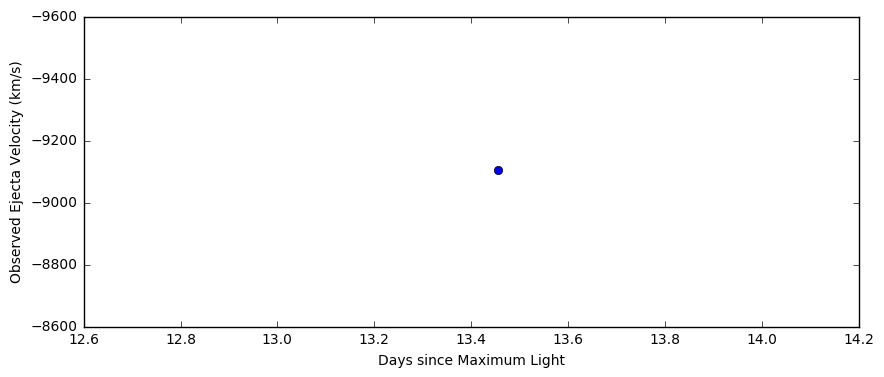

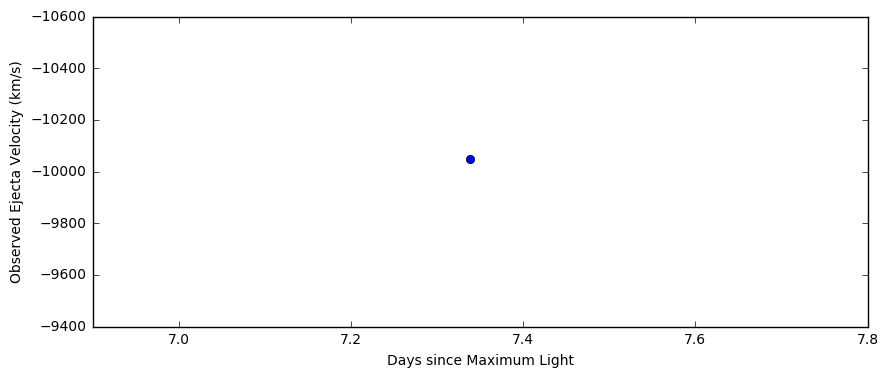

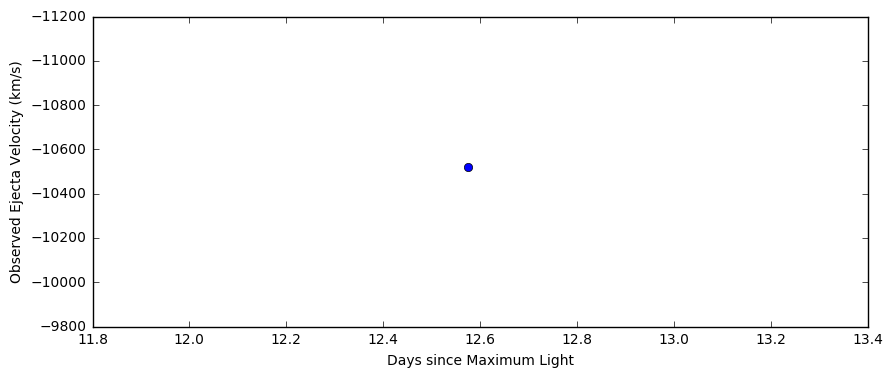

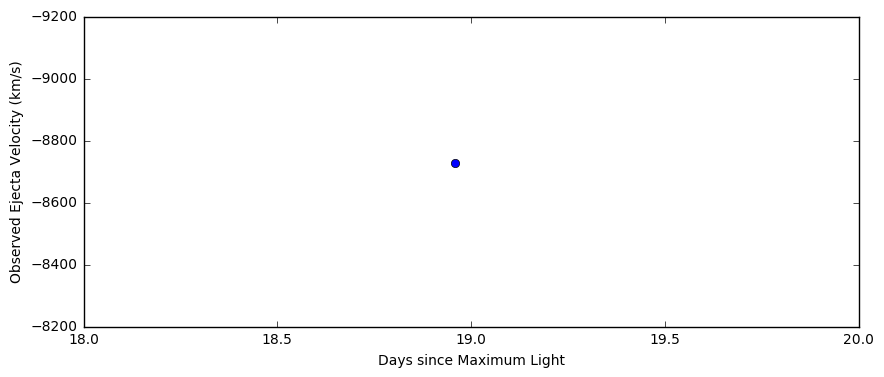

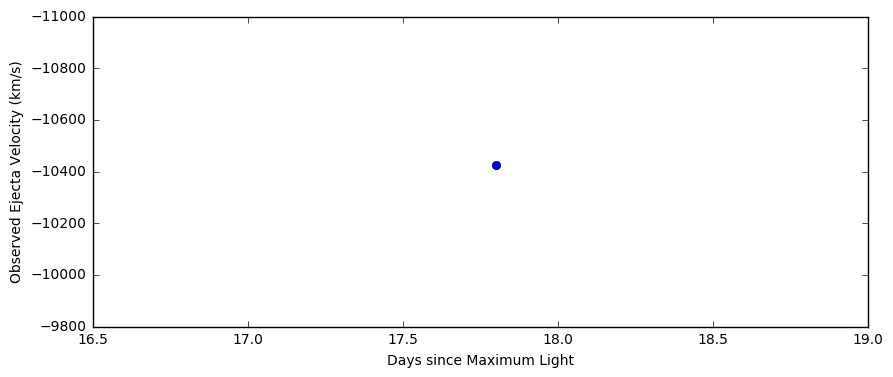

...

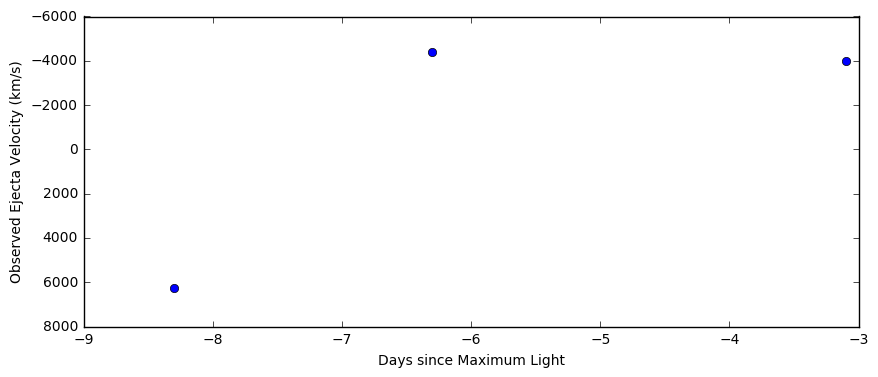

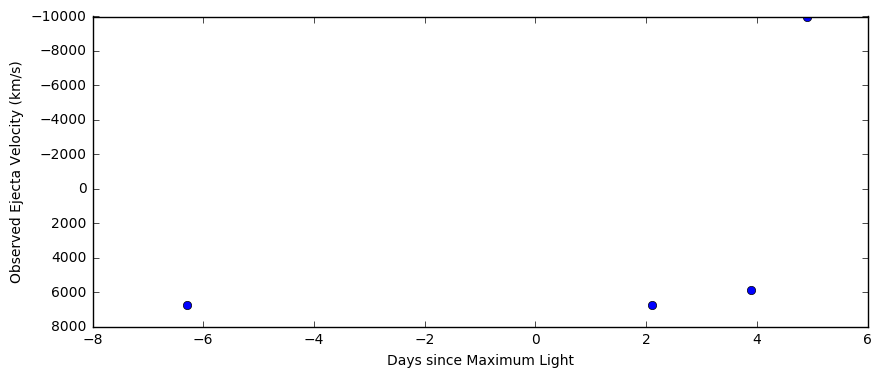

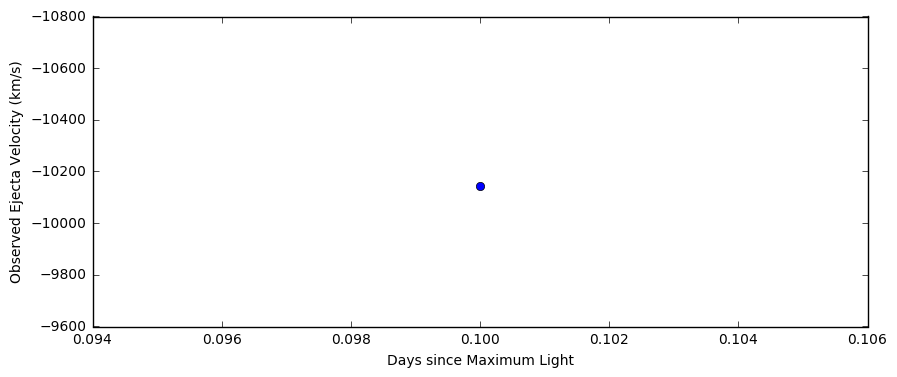

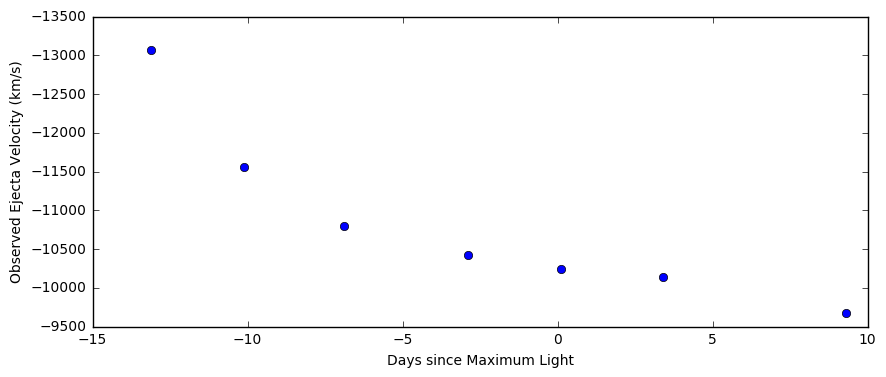

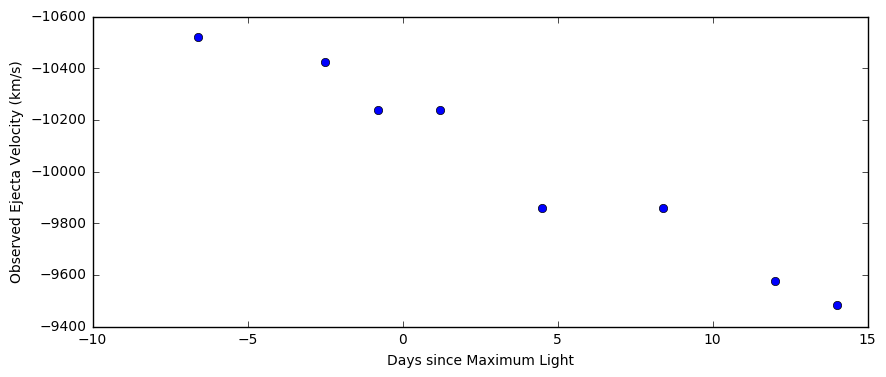

In [26]:
for event in big_table:
    event_times = []
    event_velocities = []
    
    for moment in event:
        event_times.append(moment[0])
        event_velocities.append(moment[1])
    
    
    plt.figure(figsize=(10,4))
    plt.xlabel("Days since Maximum Light")
    plt.ylabel("Observed Ejecta Velocity (km/s)")
    plt.plot(event_times, event_velocities, "o")
    plt.plot
    ax = plt.gca()
    ax.invert_yaxis()
    plt.show()